## Explainable AI for image classification

### Prepare images for the methods

In [1]:
import os
import random

from keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.applications.resnet50 import preprocess_input

from tf_keras_vis.saliency import Saliency
from tf_keras_vis.gradcam import Gradcam

from tf_keras_vis.utils.model_modifiers import ReplaceToLinear

import matplotlib.pyplot as plt

import numpy as np


IMG_SIZE = (224, 224)

CLASS_NAMES = ['BACK', 'DEB', 'LYM', 'ADI', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']
VAL_IMG_FOLDER_NAME = '../../CRC-VAL-HE-7K'

class_folders = {
    CLASS_NAMES[i]: os.path.join(VAL_IMG_FOLDER_NAME, CLASS_NAMES[i]) for i in range(len(CLASS_NAMES))
}

images = []
image_titles = []

# load 10 images for each class
for class_name, folder_path in class_folders.items():
    image_paths = [os.path.join(folder_path, file_name) for file_name in os.listdir(folder_path) if file_name.endswith('.jpg')]
    selected_image_paths = random.sample(image_paths, 10)
    for image_path in selected_image_paths:
        img = load_img(image_path, target_size=IMG_SIZE)
        images.append(np.array(img))
        image_titles.append(class_name)

images = np.asarray(images)
X = preprocess_input(images)

### Create model modifier and score function

In [2]:
# create the model modifier and score objects
replace2linear = ReplaceToLinear()

def score_function(output):
    # The `output` variable refers to the output of the model,
    # so, in this case, `output` shape is `(3, 1000)` i.e., (samples, classes).
    return (
        output[0][0], output[1][0], output[2][0], output[3][0], output[4][0], output[5][0], output[6][0], output[7][0], output[8][0], output[9][0],
        output[10][1], output[11][1], output[12][1], output[13][1], output[14][1], output[15][1], output[16][1], output[17][1], output[18][1], output[19][1],
        output[20][2], output[21][2], output[22][2], output[23][2], output[24][2], output[25][2], output[26][2], output[27][2], output[28][2], output[29][2],
        output[30][3], output[31][3], output[32][3], output[33][3], output[34][3], output[35][3], output[36][3], output[37][3], output[38][3], output[39][3],
        output[40][4], output[41][4], output[42][4], output[43][4], output[44][4], output[45][4], output[46][4], output[47][4], output[48][4], output[49][4],
        output[50][5], output[51][5], output[52][5], output[53][5], output[54][5], output[55][5], output[56][5], output[57][5], output[58][5], output[59][5],
        output[60][6], output[61][6], output[62][6], output[63][6], output[64][6], output[65][6], output[66][6], output[67][6], output[68][6], output[69][6],
        output[70][7], output[71][7], output[72][7], output[73][7], output[74][7], output[75][7], output[76][7], output[77][7], output[78][7], output[79][7],
        output[80][8], output[81][8], output[82][8], output[83][8], output[84][8], output[85][8], output[86][8], output[87][8], output[88][8], output[89][8],
    )

### Load the trained model

In [3]:
model = load_model('../../models/resnet_scratch_50_12.h5')

Metal device set to: Apple M1 Max

systemMemory: 32.00 GB
maxCacheSize: 10.67 GB



### Vanilla Saliency


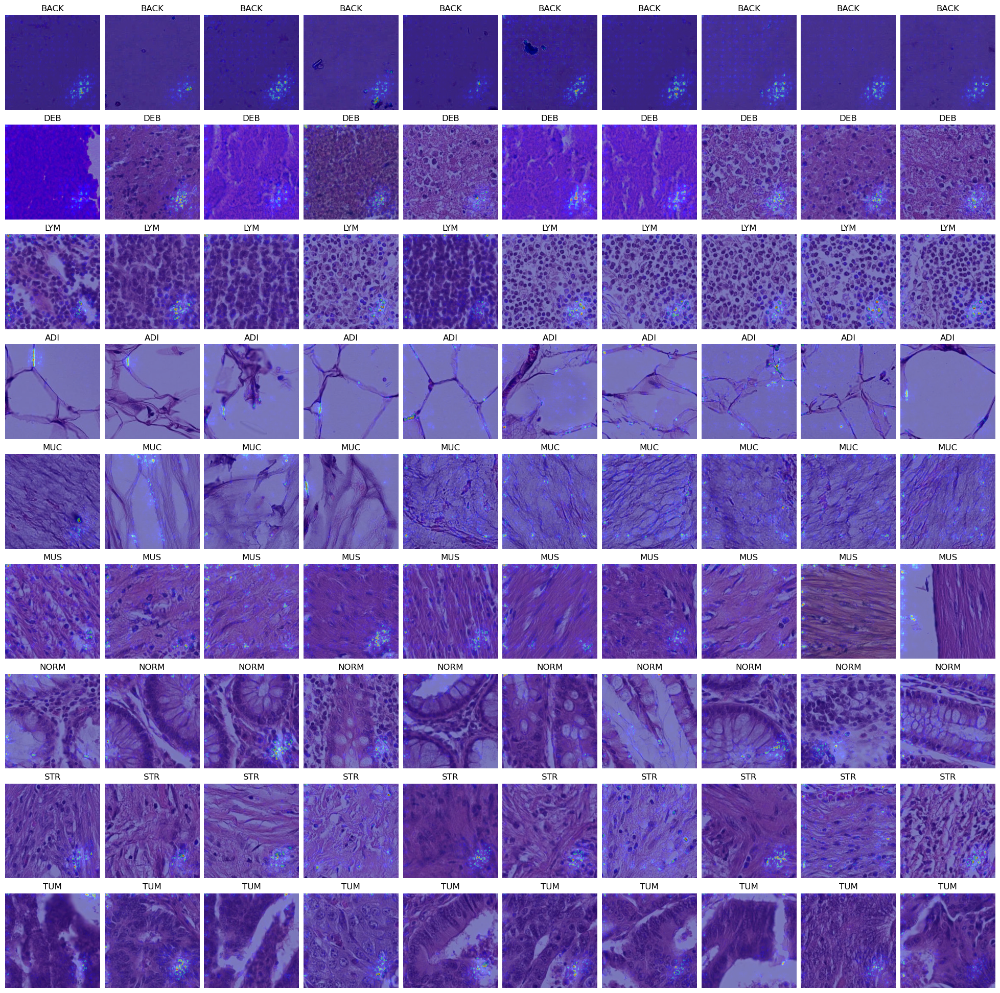

In [6]:
vanilla_saliency = Saliency(
    model,
    model_modifier=replace2linear,
    clone=True,
)

saliency_map = vanilla_saliency(score_function, X)

fig, axes = plt.subplots(9, 10, figsize=(25, 25))
for i in range(9):
    for j in range(10):
        k = i * 10 + j
        axes[i, j].imshow(images[k])
        axes[i, j].imshow(saliency_map[k], cmap='jet', alpha=0.50)
        axes[i, j].set_title(image_titles[k])
        axes[i, j].axis('off')

plt.subplots_adjust(wspace=0.05, hspace=0.05)

plt.show()

### Grad-CAM

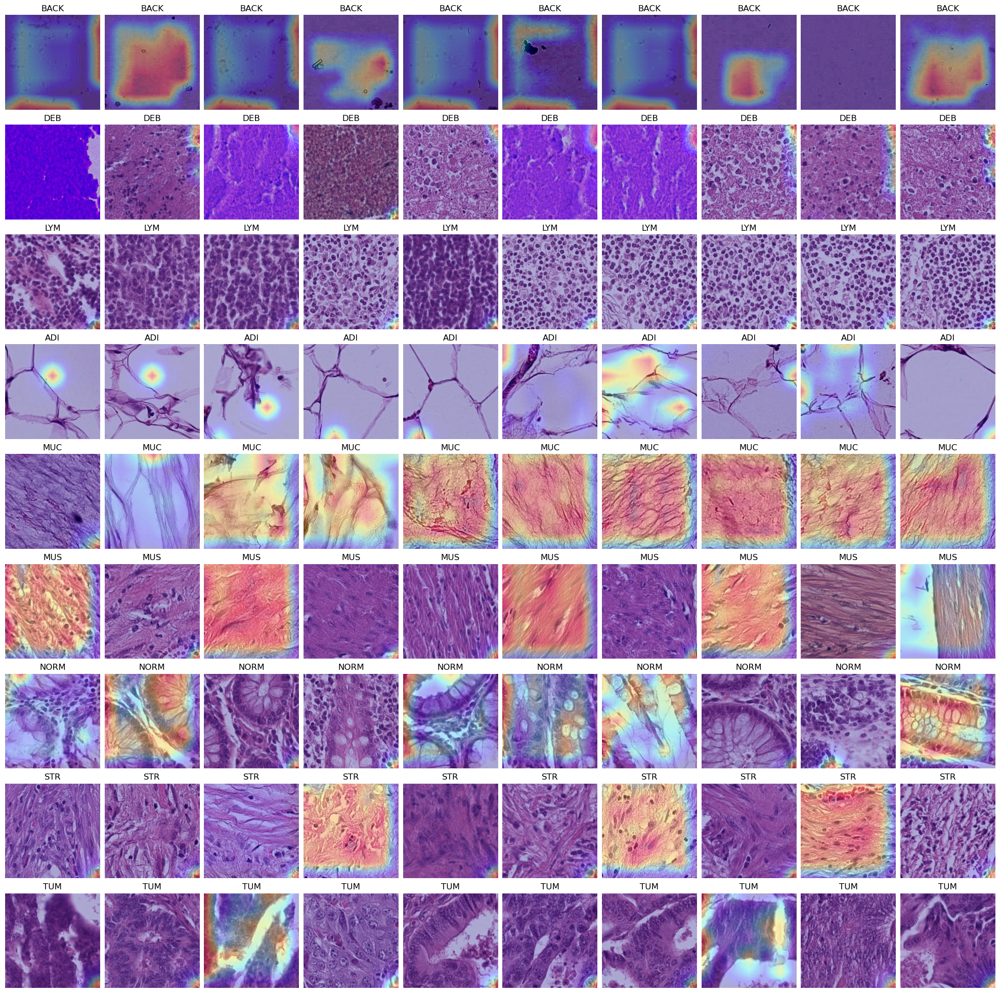

In [7]:
grad_cam = Gradcam(
    model,
    model_modifier=replace2linear,
    clone=True,
)

cm_map = grad_cam(score_function, X, penultimate_layer=-1)

fig, axes = plt.subplots(9, 10, figsize=(25, 25))
for i in range(9):
    for j in range(10):
        k = i * 10 + j
        axes[i, j].imshow(images[k])
        axes[i, j].imshow(cm_map[k], cmap='jet', alpha=0.30)
        axes[i, j].set_title(image_titles[k])
        axes[i, j].axis('off')

plt.subplots_adjust(wspace=0.05, hspace=0.05)

plt.show()

### Convolution layers and dense layers image processing visualization

In [8]:
model.summary() # to see what layers are available

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_5[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                            

#### Conv

200/200 [==============================] - 9s 43ms/step - Score: 0.9037 - TotalVariation2D: 4.0671 - Norm: 38.0364


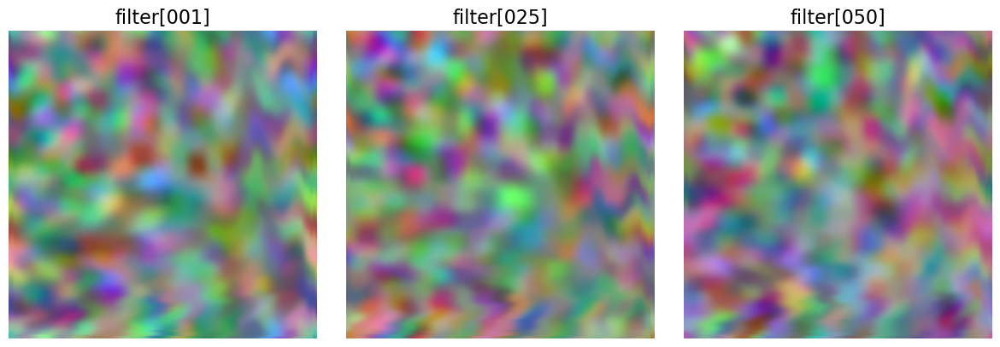

In [29]:
from tf_keras_vis.utils.model_modifiers import ExtractIntermediateLayer
from tf_keras_vis.utils.scores import CategoricalScore
from tf_keras_vis.activation_maximization import ActivationMaximization
from tf_keras_vis.activation_maximization.callbacks import Progress
import tensorflow as tf



layer_name = 'conv2_block1_1_conv'  # the target layer to visualize

extract_intermediate_layer = ExtractIntermediateLayer(index_or_name=layer_name)


def model_modifier_function(current_model):
    target_layer = current_model.get_layer(name=layer_name)
    target_layer.activation = tf.keras.activations.linear
    new_model = tf.keras.Model(
        inputs=current_model.inputs,
        outputs=target_layer.output
    )
    return new_model


filter_numbers = [1, 25, 50]
scores = CategoricalScore(filter_numbers)
seed_input = tf.random.uniform((3, 224, 224, 3), 0, 255)


activation_maximization = ActivationMaximization(
    model,
    model_modifier=[extract_intermediate_layer, model_modifier_function],
    clone=False
)

activations = activation_maximization(
    scores,
    seed_input=seed_input,
    callbacks=[Progress()]
)

activations = (activations - tf.reduce_min(activations)) / (tf.reduce_max(activations) - tf.reduce_min(activations))

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, filter_number in enumerate(filter_numbers):
    ax[i].set_title('filter[{:03d}]'.format(filter_number), fontsize=16)
    ax[i].imshow(activations[i])
    ax[i].axis('off')
plt.tight_layout()
plt.show()

#### Dense

In [34]:
CLASS_NAMES

['BACK', 'DEB', 'LYM', 'ADI', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']

In [42]:
def model_modifier_function(cloned_model):
    cloned_model.layers[-1].activation = tf.keras.activations.linear

In [46]:
def score_function(output):
    return (output[0, 1], output[0, 2], output[0, 3], output[0, 4], output[0, 5], output[0, 6], output[0, 7], output[0, 8])

In [47]:
activation_maximization = ActivationMaximization(
    model,
    model_modifier=model_modifier_function,
    clone=True
)

seed_input = tf.random.uniform((3, 224, 224, 3), 0, 255)

200/200 [==============================] - 24s 118ms/step - Score: -2.4345 - TotalVariation2D: 4.1698 - Norm: 38.0481


AttributeError: 'numpy.ndarray' object has no attribute 'imshow'

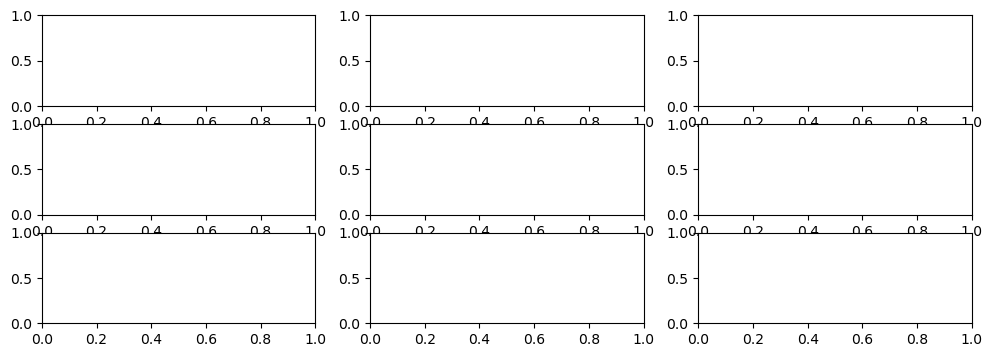

In [49]:
activations = activation_maximization(
    score_function,
    seed_input=seed_input,
    callbacks=[Progress()]
)

activations = (activations - tf.reduce_min(activations)) / (tf.reduce_max(activations) - tf.reduce_min(activations))

fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(12, 4))
for i, title in enumerate(CLASS_NAMES):
    ax[i].imshow(activations[i])
    ax[i].axis('off')
plt.tight_layout()
plt.show()